In [1]:
%matplotlib inline
import poppy
import astropy.units as u

In [10]:
# Configure for higher DPI display, on Mac OS systems with Retina hi-DPI displays. 
# This is optional, but helpful for seeing the thin segment gaps
from matplotlib_inline.backend_inline import set_matplotlib_formats
set_matplotlib_formats('retina')
matplotlib.rcParams['figure.dpi'] = 150
matplotlib.rcParams['figure.figsize'] = (5,6)

## Set up models for the 3 TAG exploratory analytic cases

<Axes: title={'center': 'Transmittance for HWO, Exploratory Analytic Case 1'}, ylabel='[meters]'>

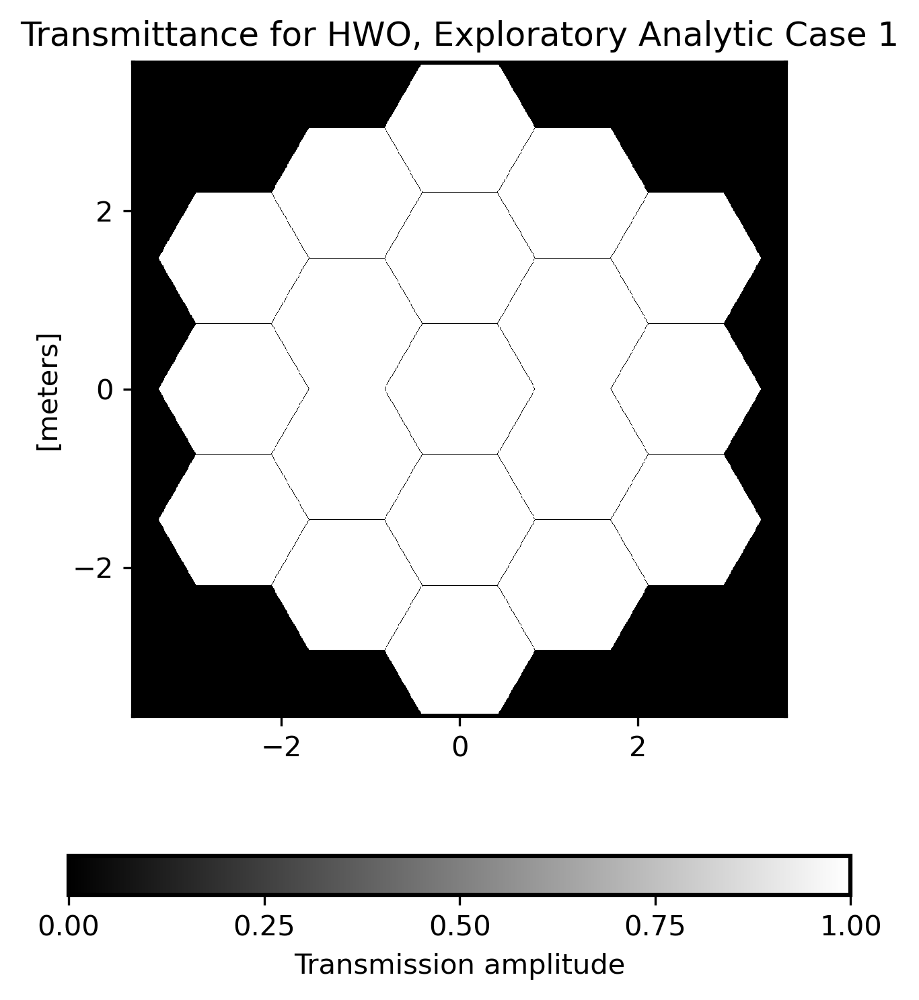

In [11]:
eac1_ap = poppy.HexSegmentedDeformableMirror(name='HWO, Exploratory Analytic Case 1', flattoflat=1.46, gap=6*u.mm, rings=2, center=True)
eac1_ap.display(npix=1024)

<Axes: title={'center': 'Transmittance for HWO, Exploratory Analytic Case 2'}, ylabel='[meters]'>

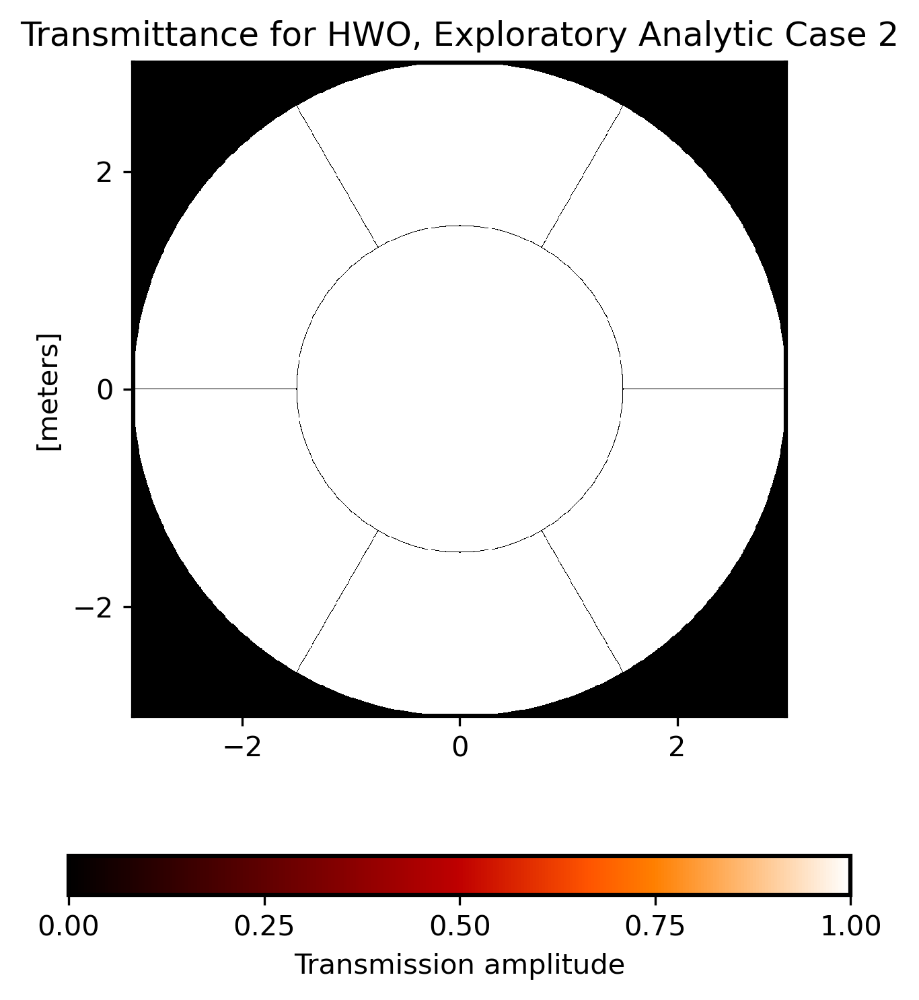

In [12]:
eac2_ap = poppy.WedgeSegmentedDeformableMirror(name='HWO, Exploratory Analytic Case 2', gap=6*u.mm, rings=2, 
                                      nsections=[1,6], 
                                      gap_radii=[3*u.m/2],
                                      radius=6*u.m/2)
eac2_ap.display(npix=1024)

<Axes: title={'center': 'Transmittance for HWO, Exploratory Analytic Case 3'}, ylabel='[meters]'>

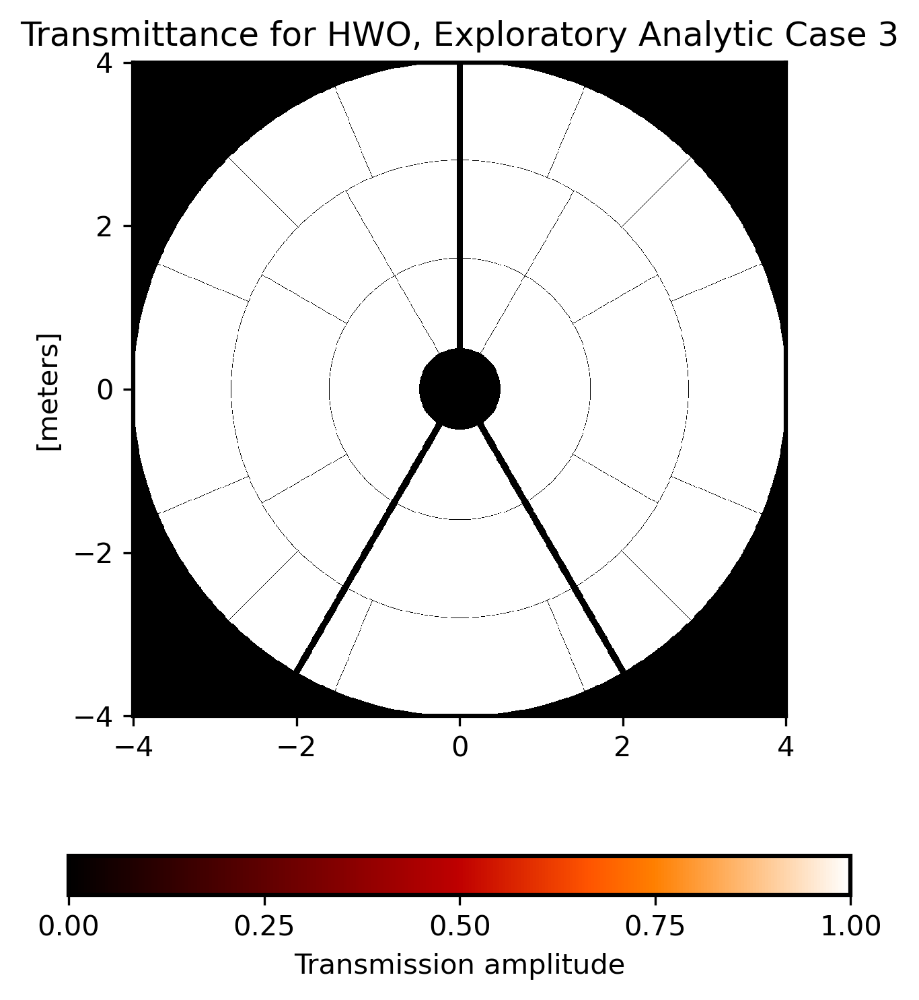

In [92]:
eac3_ap = poppy.WedgeSegmentedDeformableMirror(name='HWO, EAC 3', gap=6*u.mm, rings=4, 
                                      nsections=[0,6,12, 16], 
                                      gap_radii=[0.4*u.m, 1.6*u.m, 2.8*u.m],
                                      radius=4*u.m)
obscuration = poppy.AsymmetricSecondaryObscuration(secondary_radius=0.5*u.m, 
                                                   support_angle=[0, 150, 210], support_width=8*u.cm)

eac3_ap_obscured = poppy.CompoundAnalyticOptic([eac3_ap, obscuration], name='HWO, Exploratory Analytic Case 3')

eac3_ap_obscured.display(npix=1024)

## Idealized Perfect PSF simulations

This runs broadband simulations with many wavelengths, on very finely sampled apertures (4096 pixels) to allow very precise models of segment gaps, and on a finely-sampled detector pixel scale (8 milliarcsec, so Nyquist sampled at .6 microns for an 8 m diameter). This level of fineness may be overkill for many science applications, and is slightly time consuming. (~a couple minutes runtime)

In [17]:
nlam =  20 
waves_f606w = np.linspace(0.47, 0.71, nlam)*1e-6

In [18]:
# optional, performance tweaks to optimize PSF calculation speed below
poppy.conf.use_multiprocessing = True
poppy.conf.use_mkl = True
poppy.conf.use_fftw = False


In [104]:
apertures = [eac1_ap, eac2_ap, eac3_ap_obscured]

In [19]:
psfs = []

for ap in apertures:
    print(f'Simulating PSF for {ap.name}')
    hwo = poppy.OpticalSystem(npix=4096)
    hwo.add_pupil(ap)
    hwo.add_detector(pixelscale=0.008, fov_pixels=128, )  
    psf = hwo.calc_psf(wavelength=waves_f606w)
    psfs.append(psf)

Simulating PSF for HWO, Exploratory Analytic Case 1
Simulating PSF for HWO, Exploratory Analytic Case 2
Simulating PSF for HWO, Exploratory Analytic Case 3


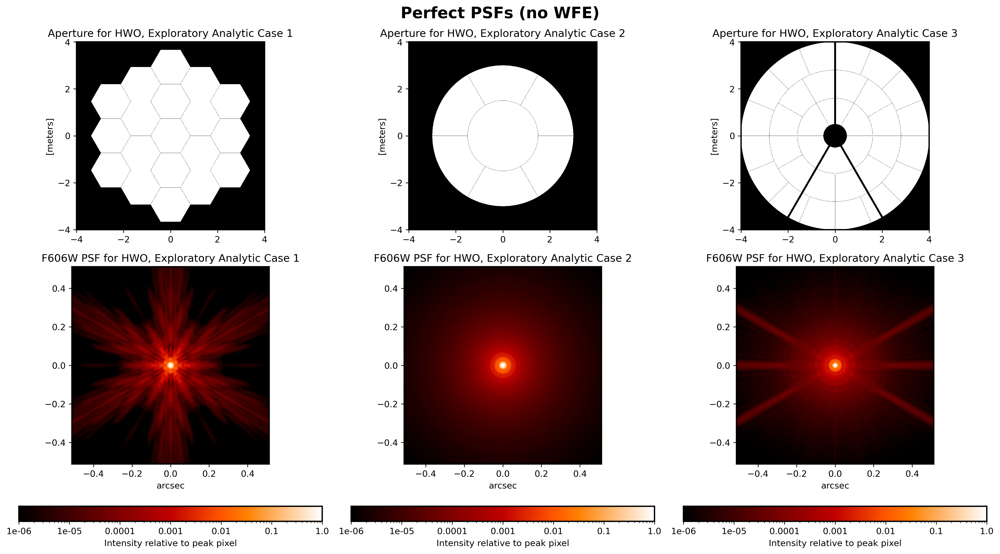

In [109]:
fig, axes = plt.subplots(figsize=(16,9), nrows=2, ncols=3, gridspec_kw={'height_ratios':[1, 1.5]})

for i, (ap, psf) in enumerate(zip (apertures, psfs)):
    
    ap.display(ax=axes[0, i], colorbar=False, grid_size=8, npix=2048)
    axes[0, i].set_title("Aperture for "+ap.name)
    
    poppy.display_psf(psf, ax=axes[1,i], title="F606W PSF for "+ap.name, 
                      normalize='peak', vmax=1, vmin=1e-6, colorbar_orientation='horizontal')
plt.suptitle("Perfect PSFs (no WFE)", fontweight='bold', fontsize=18)
plt.tight_layout()

plt.savefig('hwo_eac_psfs_f606w_wfe=0.pdf', dpi=600)


## Case with some wavefront error: simulate imperfect segment alignment

In [128]:
# create repeatable/reproducible random number pool
rng = np.random.default_rng(100)

ptt_aberrations = rng.normal(size=(34, 3)) 

In [288]:
# ad hoc. Tweak the applied PTT amplitudes per axis to achieve roughly 22 nm rms per each aperture
# this in effect is compensating for the differences in segment size and geometry
scalefactors = [2e-8, 1.7e-8, 2.2e-8]

for iap, ap in enumerate([eac1_ap, eac2_ap, eac3_ap]):
    for i, segnum in enumerate(ap.segmentlist):
        ap.set_actuator(segnum, *ptt_aberrations[i]* scalefactors[iap]* 0.75)

In [289]:
ap.get_phasor(wave)
rms(ap)

<Quantity 16.86883619 nm>

In [130]:
# this cell makes it mark the segment numbers in sequence

#scalefactors = [2e-8, 1.7e-8, 2.2e-8]
#
#for iap, ap in enumerate([eac1_ap, eac2_ap, eac3_ap]):
#    for i, segnum in enumerate(ap.segmentlist):
#        ap.set_actuator(segnum, segnum*1e-9, 0, 0)

In [199]:
def rms(optic):
    try:
        mask = optic.transmission>0
    except:
        mask = optic.amplitude>0
    return (np.sqrt((optic.opd[mask]**2).mean())*u.meter).to(u.nm)

In [107]:
psfs_aberrated = []

for ap in apertures:
    print(f'Simulating PSF for {ap.name}')
    hwo = poppy.OpticalSystem(npix=4096)
    hwo.add_pupil(ap)
    hwo.add_detector(pixelscale=0.008, fov_pixels=128, )  
    psf = hwo.calc_psf(wavelength=waves_f606w)
    psfs_aberrated.append(psf)

Simulating PSF for HWO, Exploratory Analytic Case 1
Simulating PSF for HWO, Exploratory Analytic Case 2
Simulating PSF for HWO, Exploratory Analytic Case 3


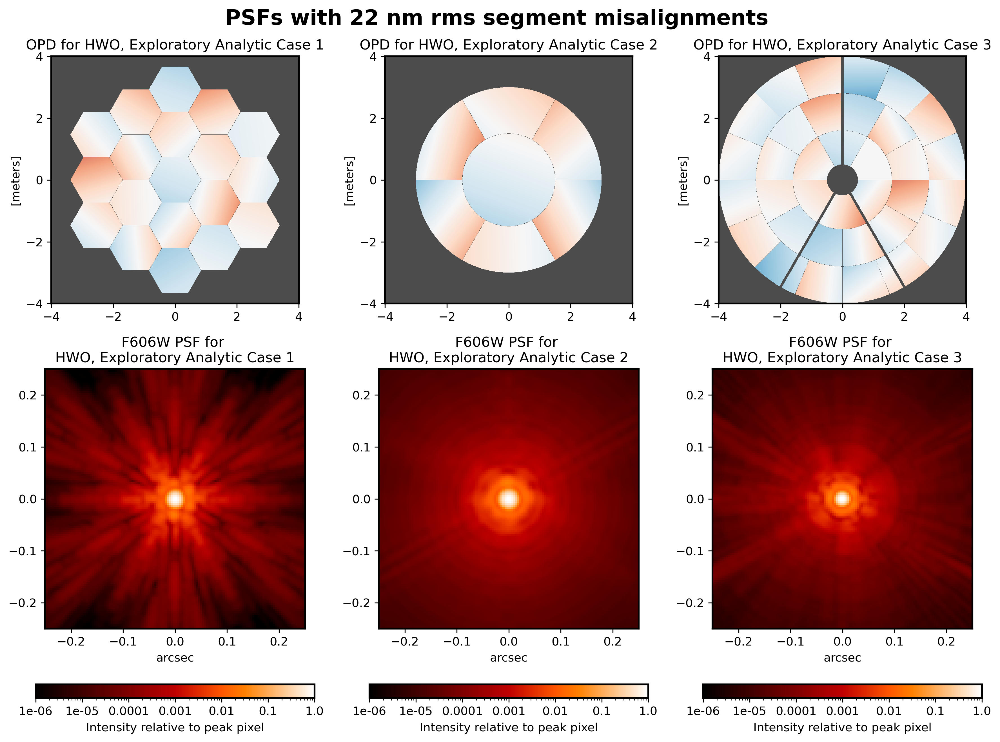

In [290]:
fig, axes = plt.subplots(figsize=(12,9), nrows=2, ncols=3, gridspec_kw={'height_ratios':[1, 1.5]})

for i, (ap, psf) in enumerate(zip (apertures, psfs_aberrated)):
    
    ap.display(ax=axes[0, i], colorbar=False, grid_size=8, npix=2048, what='opd', opd_vmax=1e-7)
    axes[0, i].set_title("OPD for "+ap.name)
    
    poppy.display_psf(psf, ax=axes[1,i], title="F606W PSF for \n"+ap.name, 
                      normalize='peak', vmax=1, vmin=1e-6, colorbar_orientation='horizontal', imagecrop=0.5)
plt.suptitle("PSFs with 22 nm rms segment misalignments", fontweight='bold', fontsize=18)

plt.tight_layout()
plt.savefig('hwo_eac_psfs_f606w_wfe=22_v2.pdf', dpi=600)


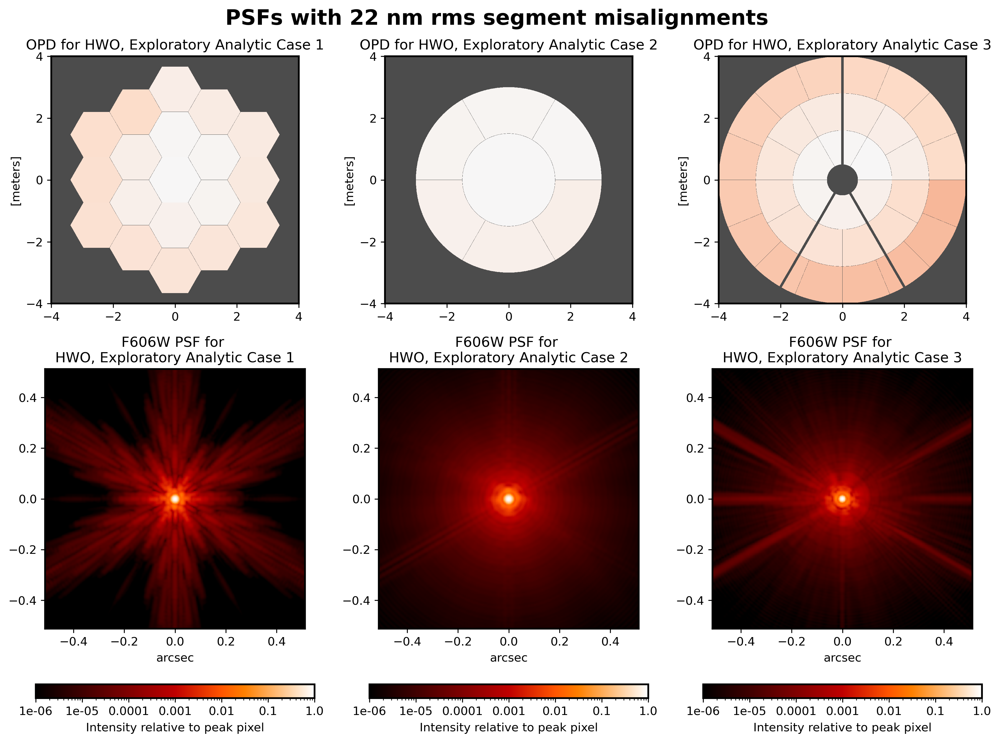

In [126]:
fig, axes = plt.subplots(figsize=(12,9), nrows=2, ncols=3, gridspec_kw={'height_ratios':[1, 1.5]})

for i, (ap, psf) in enumerate(zip (apertures, psfs_aberrated)):
    
    ap.display(ax=axes[0, i], colorbar=False, grid_size=8, npix=2048, what='opd', opd_vmax=1e-7)
    axes[0, i].set_title("OPD for "+ap.name)
    
    poppy.display_psf(psf, ax=axes[1,i], title="F606W PSF for \n"+ap.name, 
                      normalize='peak', vmax=1, vmin=1e-6, colorbar_orientation='horizontal')
plt.suptitle("Mock HWO PSFs with 22 nm rms segment misalignments", fontweight='bold', fontsize=18)

plt.tight_layout()
plt.savefig('hwo_eac_psfs_f606w_wfe=22.pdf', dpi=600)


## Work in progress - add higher order mirror surface WFE

In [202]:
# Set up radial PSD distribution
def psd_model(k, psd_parm):
    # k: array/matrix of spatial frequencies
    # psd_parm: list with the PSD parameters
    alpha = psd_parm[0]
    beta = psd_parm[1]
    oscl = psd_parm[2]
    iscl = psd_parm[3]
    bsr = psd_parm[4]
    if oscl.value != 0:
        denom = ( ((1/oscl)**2) + (k**2))**(alpha/2)
    else: # explosion prevention
        denom = (k**2)**(alpha/2)
    pk = ((beta/denom) * np.exp(-((k.value*iscl)**2))) + bsr
    return pk


Text(0.5, 1.0, 'Example PSD distribution')

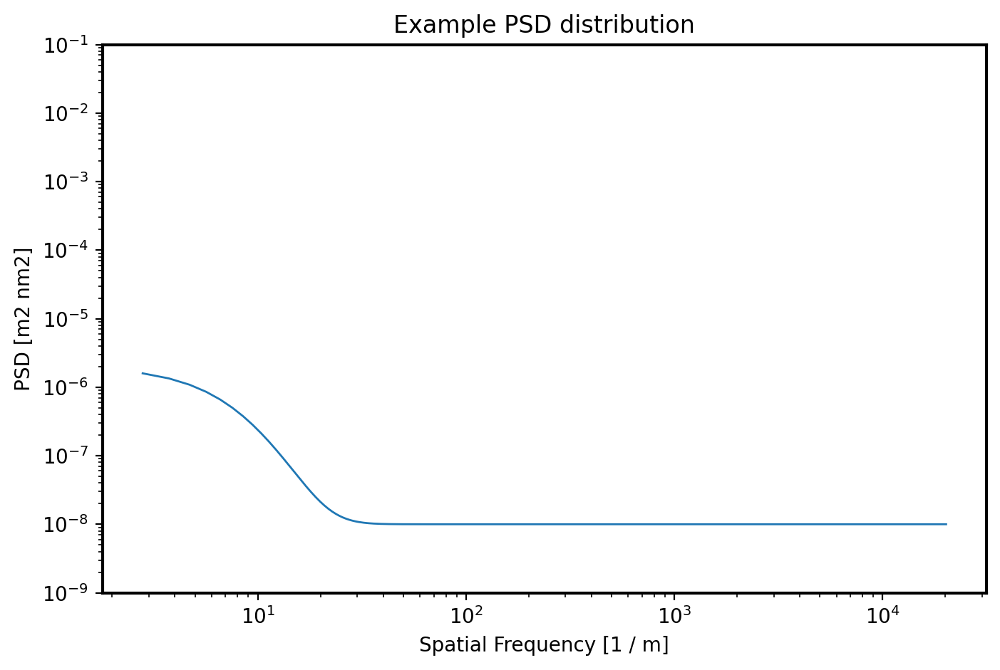

In [206]:
# Unit establishment - the model values provided here are determined by using these units
space_unit = u.m # POPPY defaults to meters, this is mandatory.
surface_unit = u.nm # Adjustable with modeling. PowerSpectrumWFE will produce opd in meters as POPPY requires.

# Test case parameters
alpha = 1.55
beta = 0.637 * (surface_unit**2) / (space_unit**(alpha-2))
oscl = (1*space_unit)
iscl = 0.0003
bsr = 1e-8 * (surface_unit*space_unit)**2 # original test case value is 0, adjusted for demo
parm_test = [[alpha, beta, oscl, iscl, bsr]]

alpha = 6
beta = 2. * (surface_unit**2) / (space_unit**(alpha-2))
oscl = (0.1*space_unit)
iscl = 0.03
bsr = 1e-8 * (surface_unit*space_unit)**2 # original test case value is 0, adjusted for demo
parm_test = [[alpha, beta, oscl, iscl, bsr]]
weight_test = [1.0]

# Set up a spatial frequency range. Keep pretty fine spacing to see the lower spatial freq content.
k_range = (np.arange(start=2.8, stop=20176, step=0.95)/space_unit)
psd1 = psd_model(k_range, parm_test[0]) 
psd1 = psd1 * weight_test[0]

plt.figure(figsize=[8,5], dpi=100)
plt.loglog(k_range.value, psd1.value)
plt.ylim(top=0.1, bottom=1e-9)
plt.xlabel('Spatial Frequency [{0}]'.format(k_range.unit))
plt.ylabel('PSD [{0}]'.format(psd1.unit))
plt.title('Example PSD distribution')

In [258]:
# Unit establishment - the model values provided here are determined by using these units
space_unit = u.m # POPPY defaults to meters, this is mandatory.
surface_unit = u.nm # Adjustable with modeling. PowerSpectrumWFE will produce opd in meters as POPPY requires.

# Test case parameters
alpha = 3
beta = 2. * (surface_unit**2) / (space_unit**(alpha-2))
oscl = (2*space_unit)
iscl = .25
bsr = 8*1e-8 * (surface_unit*space_unit)**2 # original test case value is 0, adjusted for demo
parm_test = [[alpha, beta, oscl, iscl, bsr]]

In [299]:
wfe = poppy.PowerSpectrumWFE(psd_parameters=parm_test, rms=10*u.nanometer, radius=4*u.meter)

<Axes: title={'center': 'OPD for Model PSD WFE'}, ylabel='[meters]'>

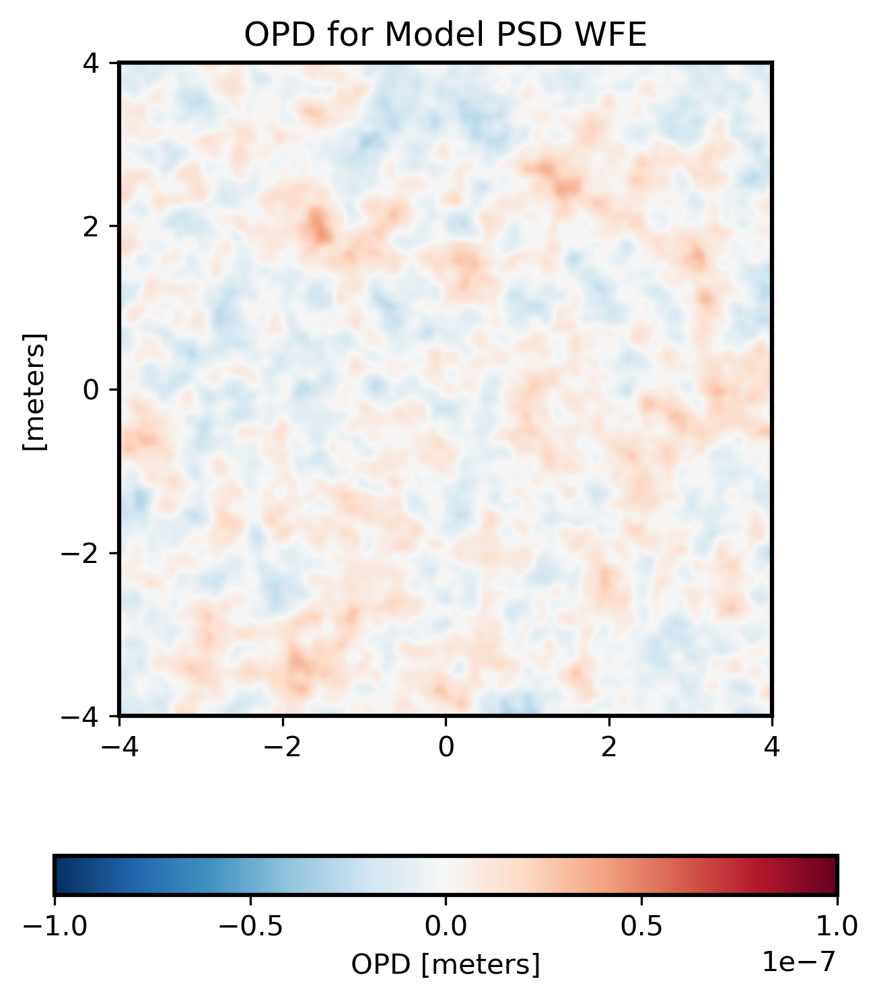

In [300]:
wfe.display(what='opd', grid_size=8*u.m, opd_vmax=100e-9)

In [301]:
sampled = wfe.sample(npix=2048, grid_size=8*u.m, what='opd')

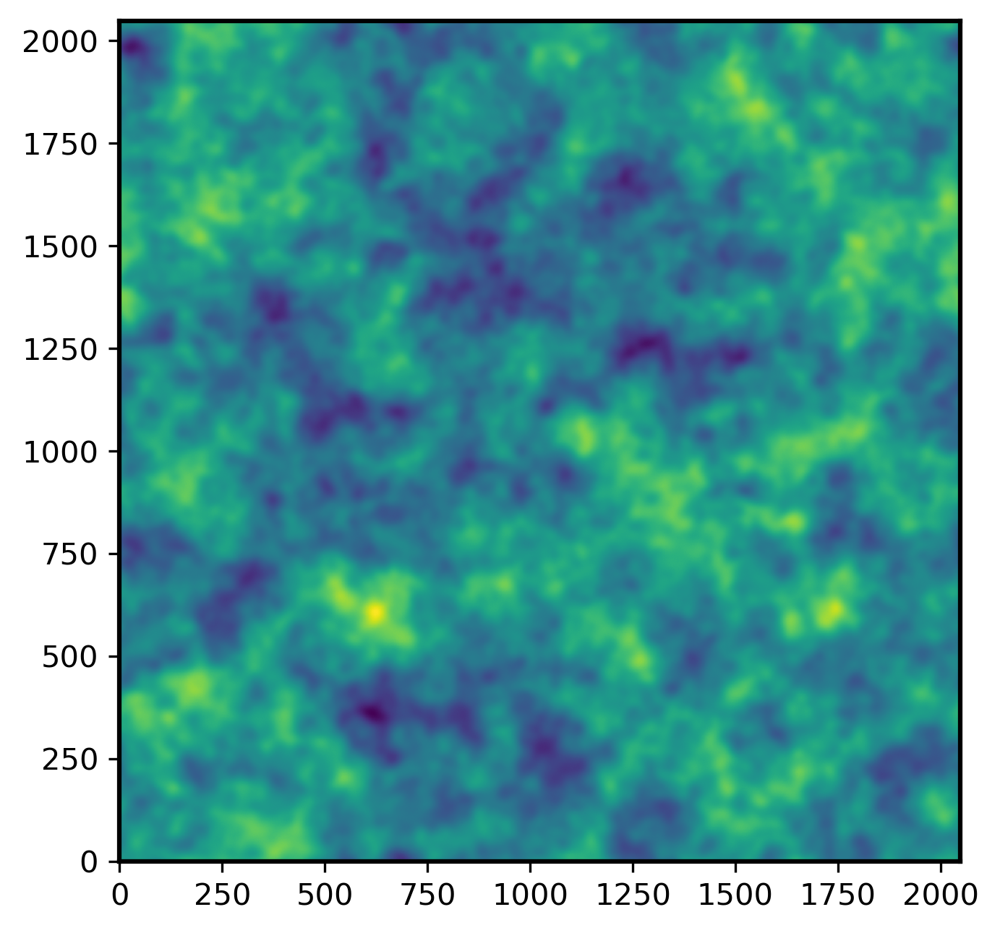

In [302]:
plt.imshow(sampled)

In [303]:
wave = poppy.Wavefront(diam=8*u.m, npix=2048)

In [304]:
wfe_sampled = poppy.fixed_sampling_optic(wfe, wavefront=wave, oversample=1)
ap_sampled = poppy.fixed_sampling_optic(ap, wavefront=wave, oversample=1)
combined_sampled = poppy.ArrayOpticalElement(opd = wfe_sampled.opd + ap_sampled.opd,
                                             transmission = ap_sampled.amplitude, 
                                             name=ap.name)

In [305]:
rms(combined_sampled)

<Quantity 19.13824445 nm>

<Axes: title={'center': 'OPD for HWO, Exploratory Analytic Case 3'}, ylabel='[meters]'>

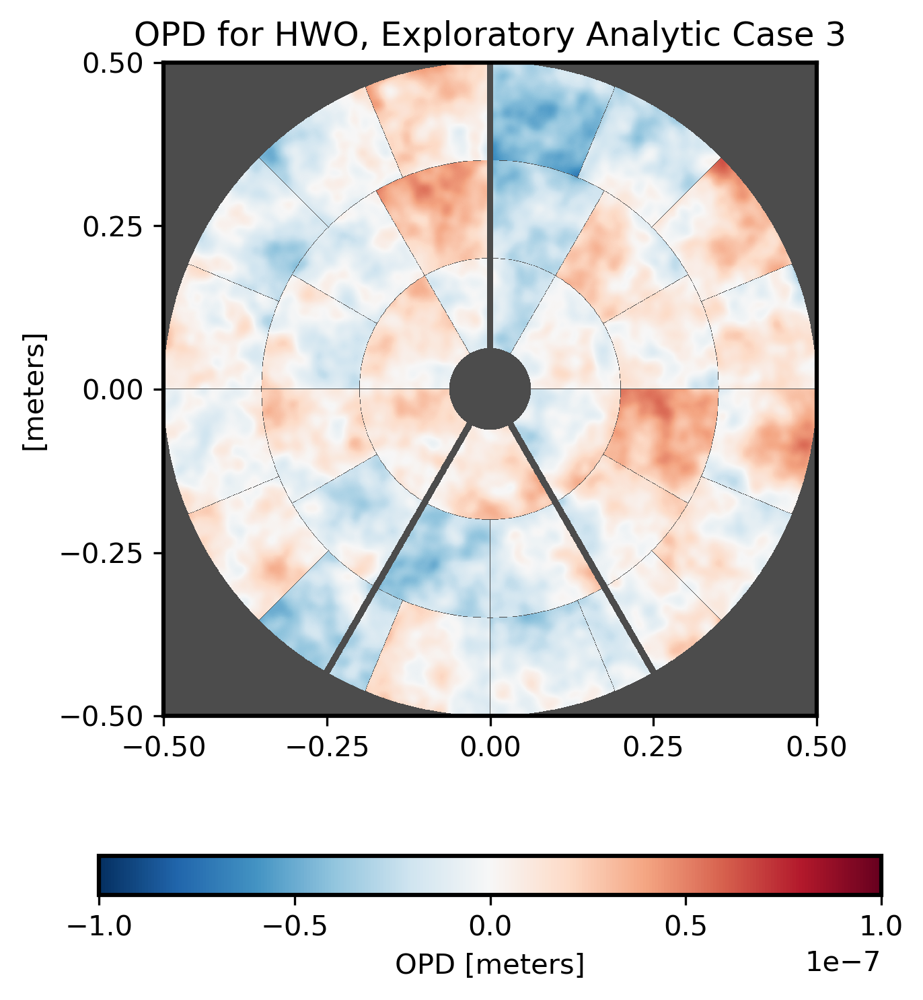

In [306]:
combined_sampled.display(what='opd', opd_vmax=1e-7)

<Axes: title={'center': 'OPD for unnamed'}, ylabel='[meters]'>

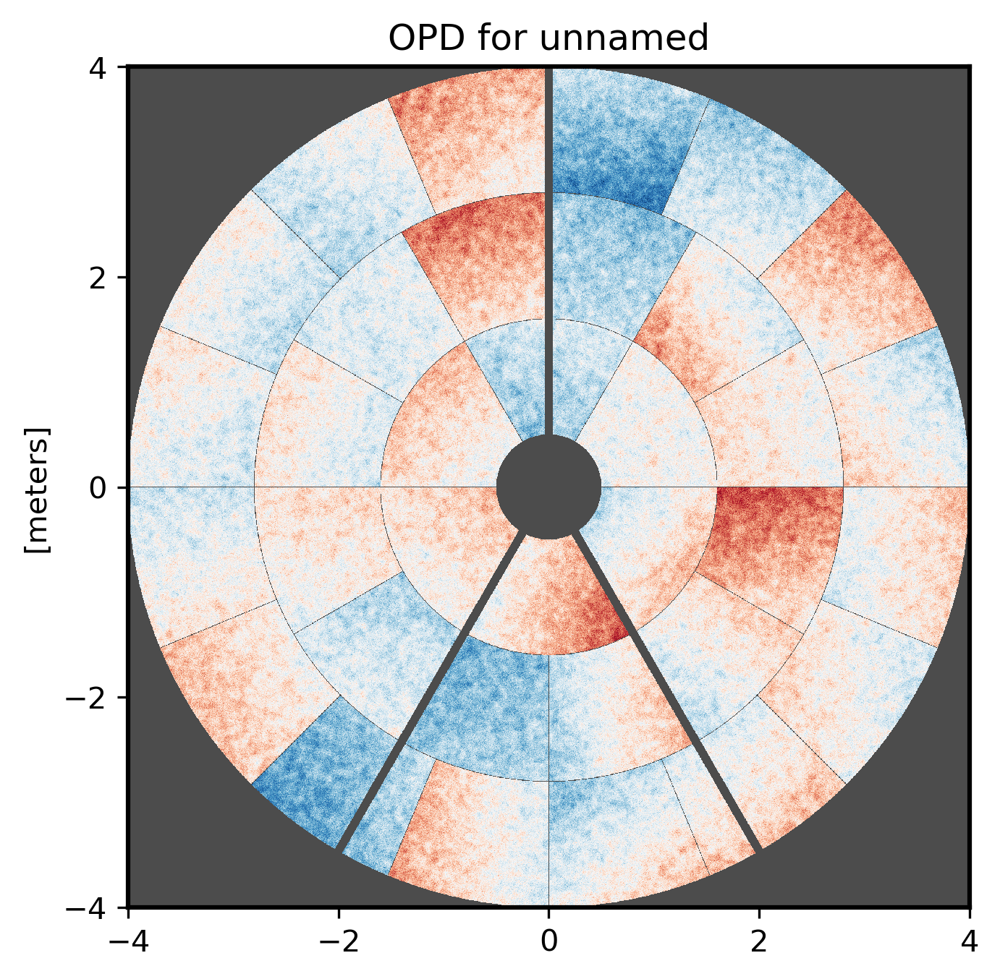

In [ ]:
combined_ap = poppy.CompoundAnalyticOptic([ap, wfe])
#print(f"RMS: {rms(combined_ap)}")
combined_ap.display(colorbar=False, grid_size=8, npix=2048, what='opd', opd_vmax=1e-7)


In [307]:
psfs_aberrated_v2 = []

for ap in apertures:
    print(f'Simulating PSF for {ap.name}')
    hwo = poppy.OpticalSystem(npix=2048)
    hwo.add_pupil(ap)
    hwo.add_pupil(wfe)    
    hwo.add_detector(pixelscale=0.008, fov_pixels=128, )  
    psf = hwo.calc_psf(wavelength=waves_f606w)
    psfs_aberrated_v2.append(psf)

Simulating PSF for HWO, Exploratory Analytic Case 1
Simulating PSF for HWO, Exploratory Analytic Case 2
Simulating PSF for HWO, Exploratory Analytic Case 3


HWO, Exploratory Analytic Case 1 17.345636342995174 nm 16.351492224755553 nm
HWO, Exploratory Analytic Case 2 16.09637561963663 nm 15.335913585614422 nm
HWO, Exploratory Analytic Case 3 17.323950999212517 nm 16.786664316298648 nm


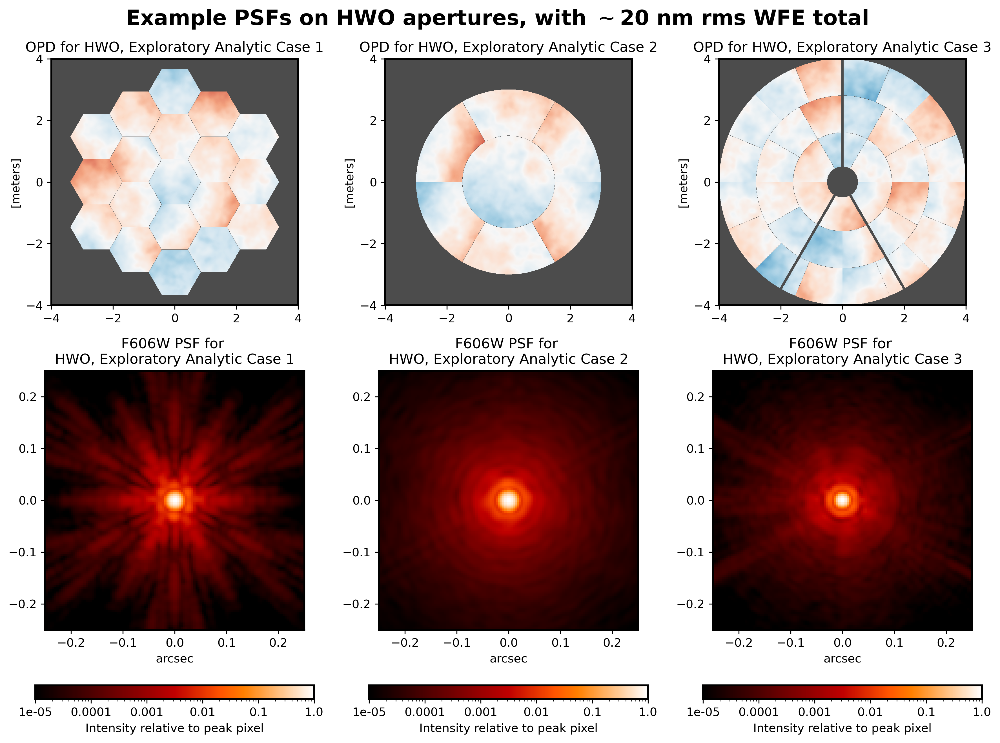

In [311]:
fig, axes = plt.subplots(figsize=(12,9), nrows=2, ncols=3, gridspec_kw={'height_ratios':[1, 1.5]})

for i, (ap, psf) in enumerate(zip (apertures, psfs_aberrated_v2)):
    
    # Just for display, make a combined optic which includes both the segments and the higher-order WFE
    wfe_sampled = poppy.fixed_sampling_optic(wfe, wavefront=wave, oversample=1)
    ap_sampled = poppy.fixed_sampling_optic(ap, wavefront=wave, oversample=1)
    combined_sampled = poppy.ArrayOpticalElement(opd = wfe_sampled.opd*0.5 + ap_sampled.opd,
                                                 transmission = ap_sampled.amplitude, 
                                                 name=ap.name)
    print(ap.name, rms(combined_sampled), rms(ap))
    combined_sampled.display(ax=axes[0, i], colorbar=False, grid_size=8, npix=2048, what='opd', opd_vmax=1e-7)
    axes[0, i].set_title("OPD for "+ap.name)
    
    poppy.display_psf(psf, ax=axes[1,i], title="F606W PSF for \n"+ap.name, 
                      normalize='peak', vmax=1, vmin=1e-5, colorbar_orientation='horizontal', imagecrop=0.5)
plt.suptitle("Example PSFs on HWO apertures, with $\sim$20 nm rms WFE total", fontweight='bold', fontsize=18)

plt.tight_layout()
plt.savefig('hwo_eac_psfs_f606w_wfe=20_v3vmin_1e-5.pdf', dpi=600)


In [278]:
rms(combined_ap), rms(ap)

(<Quantity 25.50026488 nm>, <Quantity 22.38221909 nm>)

<Axes: title={'center': 'OPD for Model PSD WFE'}, ylabel='[meters]'>

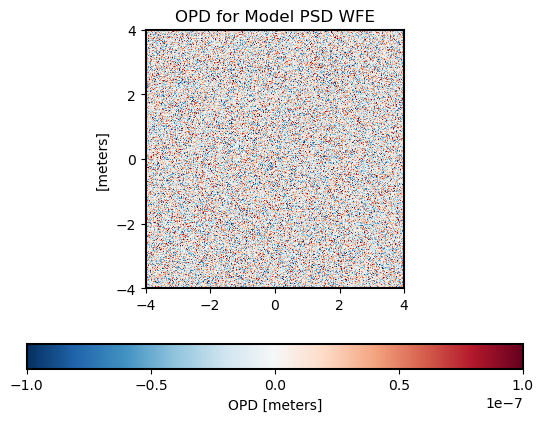

In [32]:
wfe.display(what='opd', grid_size=8*u.m, opd_vmax=100e-9)

In [ ]:
wfe_samp = 